# Run LLM agentic application

In [1]:
# Import main packages
import pandas as pd
import os
import gc
import json
import re
from datetime import datetime

# Define directories
def find_directory_upwards(dir_name):
    """
    Find the absolute path to a directory with the given name by searching upwards
    from the current notebook's directory.

    Parameters:
    dir_name (str): The name of the directory to find.

    Returns:
    str: The absolute path to the directory if found, otherwise None.
    """
    # Get the current notebook's directory
    current_dir = os.getcwd()
    
    while True:
        # Check if the directory exists in the current directory
        potential_path = os.path.join(current_dir, dir_name)
        if os.path.isdir(potential_path):
            return potential_path
        
        # Move to the parent directory
        parent_dir = os.path.abspath(os.path.join(current_dir, os.pardir))
        
        # If the current directory is the root directory, stop searching
        if current_dir == parent_dir:
            break
        
        current_dir = parent_dir
    
    # If the directory is not found, return None
    return None

code_dir = find_directory_upwards('codes')
raw_data_dir = find_directory_upwards('raw_data')
int_data_dir = find_directory_upwards('int_data')
final_data_dir = find_directory_upwards('final_data')
output_dir = find_directory_upwards('output')
ucctextextract_dir = find_directory_upwards('ucc_text_extract')

print(code_dir)
# print(raw_data_dir)
print(int_data_dir)
print(output_dir)
print(ucctextextract_dir)

/home/sosajuanbautista/aeai-filestore/projects/agentic/codes
/home/sosajuanbautista/aeai-filestore/projects/agentic/int_data
/home/sosajuanbautista/aeai-filestore/projects/agentic/output
/home/sosajuanbautista/aeai-filestore/projects/ucc_text_extract


## Retrieve initial search results

In [2]:
# Load JSON with search results
path = os.path.join(int_data_dir, 'commodity_price_sources', 'commodity_tavily_search_results.json')
with open(path, 'r') as file:
    data = json.load(file)
print(len(data))
print(data.keys())

20
dict_keys(['Rotary tiller or power tiller', 'Farming excavator', 'Mowers', 'Track excavators', 'Forklifts', 'Automobiles or cars', 'Battery energy storage control and management system', 'Solar power plants', 'General tool kits', 'Trim or molding tools', 'Gabion block', 'Toothbrush or tumbler holder', 'Computer server', 'Notebook computer', 'Desktop computer', 'Personal computer', 'Photocopiers', 'Multifunction machines', 'Office product equipment and stationery consumable', 'Inkjet printer for commercial printing applications'])


In [3]:
data['Farming excavator']

{'commodity_code': '21101526',
 'search_results': [{'query': 'Farming excavator blue book',
   'follow_up_questions': None,
   'answer': None,
   'images': [],
   'results': [{'title': 'Farm Equipment Guide - Farmers Hot Line',
     'url': 'https://www.farmershotline.com/tractor-price-guides/farm-equipment-guide',
     'content': 'Farm Equipment Guide | Farmers Hot Line Farm Equipment Guide If you appraise, evaluate, repair, identify or own farm equipment, this\xa0Hot Line Farm Equipment Guide\xa0will serve as your "blue book", and is your single source to thousands of prices, serial numbers and specifications on over 100 top manufacturers! Hot Line Farm Equipment Guide includes; optional equipment pricing. With the\xa0Farm Equipment Guide\xa0you will get real-world pricing that shows what the equipment is worth on the auction block and what you can expect in actual value. By using\xa0Farm Equipment Guide\xa0you can get the best price for your equipment and accurately determine the val

In [4]:
# Add the query to the inner most dictionary
for commodity in data.keys():
    for commodity_data in data[commodity]['search_results']:
        query = commodity_data['query']
        for result in commodity_data['results']:
            # Add the query to the content
            result['query'] = query

In [5]:
import tiktoken
enc = tiktoken.encoding_for_model("gpt-4o-mini")

# Calcuate length of content over length of raw_content, on average for all results
lengths_raw_content = []
lengths_content = []
tokens_raw_content = []
tokens_content = []
length_ratios = []

for commodity in data.keys():
    for commodity_data in data[commodity]['search_results']:
        for result in commodity_data['results']:
            # Remove repeated newlines
            result['content'] = re.sub(r'\n+', '\n', result['content'])
            result['raw_content'] = re.sub(r'\n+', '\n', result['raw_content'])

            # Keep track of stuff
            lengths_raw_content.append(len(result['raw_content']))
            tokens_raw_content.append(len(enc.encode(result['raw_content'])))
            lengths_content.append(len(result['content']))
            tokens_content.append(len(enc.encode(result['content'])))
            length_ratios.append(len(result['content']) / len(result['raw_content']))

factor = 0.075 / 1000000 / 4
print(sum(lengths_content) / len(lengths_content))
print('Avg length of raw content', sum(lengths_raw_content) / len(lengths_raw_content))
print('Implied cost of average', round(sum(lengths_raw_content) / len(lengths_raw_content) * factor,4)) # 0.075 per 1M input tokes
print('Total sum of raw content', sum(lengths_raw_content))
print('Implied cost of all this input tokens', round(sum(lengths_raw_content)* factor,4)) # 0.075 per 1M input tokes
print('Avg length of brief content', sum(length_ratios) / len(length_ratios))
print('\n')

print('Avg token of raw content', sum(tokens_raw_content) / len(tokens_raw_content))
print('Total sum of tokens in raw content', sum(tokens_raw_content))


586.9246861924686
Avg length of raw content 14790.774058577406
Implied cost of average 0.0003
Total sum of raw content 3534995
Implied cost of all this input tokens 0.0663
Avg length of brief content 0.1118290168147639


Avg token of raw content 3475.142259414226
Total sum of tokens in raw content 830559


In [6]:
import numpy as np
import pandas as pd

# Calculate the deciles
deciles = np.percentile(lengths_raw_content, np.arange(0, 110, 10))

# Create a DataFrame to display the deciles
decile_table = pd.DataFrame({
    'Decile': [f'{i}th' for i in range(0, 110, 10)],
    'Value': deciles
})

# Print the table
print(decile_table)

   Decile     Value
0     0th    1545.0
1    10th    2169.6
2    20th    3072.6
3    30th    3721.0
4    40th    4477.2
5    50th    6593.0
6    60th    8841.0
7    70th   11569.0
8    80th   17044.2
9    90th   31148.4
10  100th  205543.0


68290


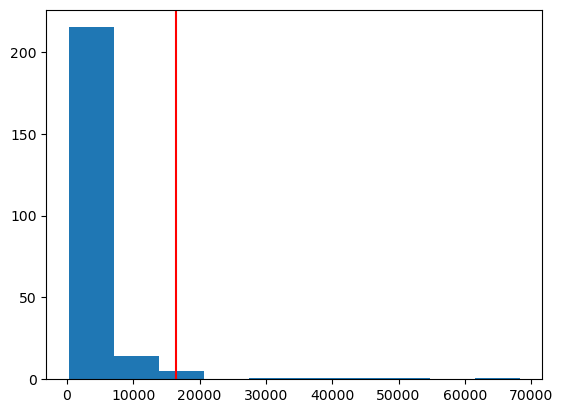

In [7]:
print(max(tokens_raw_content))

import matplotlib.pyplot as plt
max_tokens_40mini = 16384
plt.hist(tokens_raw_content)
plt.axvline(x=max_tokens_40mini, color='red')

In [8]:
import numpy as np
import pandas as pd

# Calculate the deciles
deciles = np.percentile(tokens_raw_content, np.arange(0, 110, 10))

# Create a DataFrame to display the deciles
decile_table = pd.DataFrame({
    'Decile': [f'{i}th' for i in range(0, 110, 10)],
    'Value': deciles
})

# Print the table
print(decile_table)

   Decile    Value
0     0th    288.0
1    10th    483.8
2    20th    644.0
3    30th    852.0
4    40th   1065.2
5    50th   1501.0
6    60th   1915.8
7    70th   2588.6
8    80th   3589.2
9    90th   7069.2
10  100th  68290.0


In [9]:
# Show the text with the largest amount of characters
# Initialize a variable to store the element with the most characters
largest_element = ''
max_length = 0

for commodity in data.keys():
    for commodity_data in data[commodity]['search_results']:
        for result in commodity_data['results']:
            if len(result['raw_content']) > max_length:
                max_length = len(result['raw_content'])
                largest_element = result

# Display the result
# print(f"The element with the largest amount of characters is: {largest_element}")
print(f"Length of the element: {max_length}")
print(largest_element['url'])
print(largest_element['raw_content'])


Length of the element: 205543
https://pubdocs.worldbank.org/en/849341611761898393/WorldBank-CSP-Report-Concentrating-Solar-Power-Clean-Power-on-Demand-24-7-FINAL.pdf
CONCENTRATING SOLAR POWER CLEAN POWER ON DEMAND 24/7 CONCENTRATING SOLAR POWER: CLEAN POWER ON DEMAND 24/7 2 © 2020 International Bank for Reconstruction and Development / The World Bank 1818 H Street NW | Washington DC 20433 | USA 202-473-1000 | www.worldbank.org This work is a product of the staff of the World Bank with external contributions. The findings, interpretations, and conclusions expressed in this work do not necessarily reflect the views of the World Bank, its Board of Executive Directors, or the governments they represent. The World Bank does not guarantee the accuracy of the data included in this work. The boundaries, colors, denominations, and other information shown on any map in this work do not imply any judgment on the part of the World Bank concerning the legal status of any territory or the endorsemen

In [10]:
# # RESTRICT CHARACTERS OF RAW CONTENT
# max_characters = 100000

# for commodity in data.keys():
#     for commodity_data in data[commodity]['search_results']:
#         for result in commodity_data['results']:
#             if len(result['raw_content']) > max_characters:
#                 result['raw_content'] = result['raw_content'][:max_characters]

## Get sample

In [11]:
# # Optional: Create a sample of search results to evaluate
# commodity = 'Rotary tiller or power tiller'
# commodity_data = data[commodity]

# initial_results_to_evaluate = []

# for search_term in commodity_data['search_results']:
#     query = search_term['query']
#     for r in search_term['results']:
#         r_copy = {'query': query}
#         r_copy.update(r)
#         initial_results_to_evaluate.append(r_copy)

# def remove_duplicates(dict_list):
#     seen_urls = set()
#     unique_dicts = []
    
#     for d in dict_list:
#         url = d['url']
#         if url not in seen_urls:
#             unique_dicts.append(d)  # Add the dictionary if the URL hasn't been seen
#             seen_urls.add(url)  # Mark the URL as seen
    
#     return unique_dicts

# initial_results_to_evaluate = remove_duplicates(initial_results_to_evaluate)

# print(len(initial_results_to_evaluate))
# initial_results_to_evaluate

## Calculate costs

In [12]:
data

{'Rotary tiller or power tiller': {'commodity_code': '21101517',
  'search_results': [{'query': 'Rotary tiller or power tiller blue book',
    'follow_up_questions': None,
    'answer': None,
    'images': [],
    'results': [{'title': "Rototiller Buyer's Guide - Harvest to Table",
      'url': 'https://harvesttotable.com/rototiller-buyers-guide-best-rated-tillers/',
      'content': 'Rototiller Buyer’s Guide Rototiller manufacturers make tillers in all shapes and sizes, from small, light models to large machines with good-sized motors and big rotating tines. If you have a small home garden, an electric corded rototiller should be adequate. If you have a large garden or heavy clay soil, you’ll need a large rototiller with a powerful engine. No matter what size garden or yard you have, be sure to choose a rototiller that is powerful enough to do the job. Here’s our guide to help you buy a rototiller: What are rototillers used for? What is a rototiller? rototillers Rototiller-cultivator 

In [13]:
# # Average length of query
# lengths_query = []

# for commodity in data.keys():
#     for commodity_data in data[commodity]['search_results']:
#         for result in commodity_data['results']:
#              lengths_query.append(len(result['query']))

# print(sum(lengths_query) / len(lengths_query))

In [14]:
# Create a dictionary where the keys are the commodities and the values are the search results
complete_search_results_to_evaluate = {}

def remove_duplicates(dict_list):
    seen_urls = set()
    unique_dicts = []
    
    for d in dict_list:
        url = d['url']
        if url not in seen_urls:
            unique_dicts.append(d)  # Add the dictionary if the URL hasn't been seen
            seen_urls.add(url)  # Mark the URL as seen
    
    return unique_dicts

for commodity in list(data.keys()):
    search_results = []
    for commodity_data in data[commodity]['search_results']:
        # print(commodity_data['results'])
        for result in commodity_data['results']:
            search_results.append(result)
    complete_search_results_to_evaluate[commodity] = search_results
    complete_search_results_to_evaluate[commodity] = remove_duplicates(complete_search_results_to_evaluate[commodity])

complete_search_results_to_evaluate

{'Rotary tiller or power tiller': [{'title': "Rototiller Buyer's Guide - Harvest to Table",
   'url': 'https://harvesttotable.com/rototiller-buyers-guide-best-rated-tillers/',
   'content': 'Rototiller Buyer’s Guide Rototiller manufacturers make tillers in all shapes and sizes, from small, light models to large machines with good-sized motors and big rotating tines. If you have a small home garden, an electric corded rototiller should be adequate. If you have a large garden or heavy clay soil, you’ll need a large rototiller with a powerful engine. No matter what size garden or yard you have, be sure to choose a rototiller that is powerful enough to do the job. Here’s our guide to help you buy a rototiller: What are rototillers used for? What is a rototiller? rototillers Rototiller-cultivator buying tips A. A rear-tine, gas-powered rototiller can dig 8 to 10 inches deep. Rototiller Hedge Trimmer Buyer’s Guide',
   'score': 0.99394965,
   'raw_content': "\nLatest stories\nHow to Grow Mig

In [15]:
# Count the number of results to evaluate for each commodity
num_results = {commodity: len(results) for commodity, results in complete_search_results_to_evaluate.items()}
# Calulcate the average number of results to evaluate
avg_num_results = sum(num_results.values()) / len(num_results)
print(avg_num_results)
num_results

10.65


{'Rotary tiller or power tiller': 9,
 'Farming excavator': 12,
 'Mowers': 15,
 'Track excavators': 8,
 'Forklifts': 13,
 'Automobiles or cars': 10,
 'Battery energy storage control and management system': 13,
 'Solar power plants': 14,
 'General tool kits': 7,
 'Trim or molding tools': 9,
 'Gabion block': 12,
 'Toothbrush or tumbler holder': 3,
 'Computer server': 12,
 'Notebook computer': 7,
 'Desktop computer': 9,
 'Personal computer': 11,
 'Photocopiers': 14,
 'Multifunction machines': 11,
 'Office product equipment and stationery consumable': 14,
 'Inkjet printer for commercial printing applications': 10}

In [16]:
from llm_agentic_app_for_price_sources import calculate_costs, calculate_tavily_search_cost

print("Values top 20 commodities (with justification)")
total_costs = 0
n_tavily_api_calls = 0
for commodity in complete_search_results_to_evaluate.keys():
    cost_dict = calculate_costs(
        search_results_to_evaluate=complete_search_results_to_evaluate[commodity], commodity=commodity, 
        min_similarity_score=None, use_raw_content=True, include_justification=True,
        justification_length=300, n_refined_search_terms=3, max_iterations=3, max_content_length=100000,
        refined_search_term_length=60, max_results_per_search_term=3, verbose=False
    )
    total_costs += cost_dict['total_token_cost']
    n_tavily_api_calls += cost_dict['n_tavily_api_calls']

print("Total Tavily searches for this batch:", n_tavily_api_calls)
print("Implied cost:", calculate_tavily_search_cost(n_tavily_api_calls))

n_commodity_categories=100

print(f"Total Tavily searches for {n_commodity_categories} commodity categories (inlcuding initial calls):", (n_tavily_api_calls/20*n_commodity_categories)+n_commodity_categories)
print("Implied cost:", calculate_tavily_search_cost((n_tavily_api_calls/20*n_commodity_categories)+n_commodity_categories))

print("Total estimated cost of tokens in USD:", round(total_costs,3))
print(f"Total cost for {n_commodity_categories} commodity categories in USD:", round(total_costs/20*n_commodity_categories,3))

print("Total cost overall:", round(total_costs/20*n_commodity_categories + calculate_tavily_search_cost((n_tavily_api_calls/20*n_commodity_categories)+n_commodity_categories),2))

Values top 20 commodities (with justification)
Total Tavily searches for this batch: 40
Implied cost: 0
Total Tavily searches for 100 commodity categories (inlcuding initial calls): 300.0
Implied cost: 0
Total estimated cost of tokens in USD: 0.397
Total cost for 100 commodity categories in USD: 1.987
Total cost overall: 1.99


In [17]:
from llm_agentic_app_for_price_sources import calculate_costs, calculate_tavily_search_cost

print("Values top 20 commodities (with justification)")
total_costs = 0
n_tavily_api_calls = 0
for commodity in complete_search_results_to_evaluate.keys():
    cost_dict = calculate_costs(
        search_results_to_evaluate=complete_search_results_to_evaluate[commodity], commodity=commodity, 
        min_similarity_score=None, use_raw_content=True, include_justification=True,
        justification_length=300, n_refined_search_terms=3, max_iterations=3, max_content_length=100000,
        refined_search_term_length=60, max_results_per_search_term=3, verbose=False
    )
    total_costs += cost_dict['total_token_cost']
    n_tavily_api_calls += cost_dict['n_tavily_api_calls']

print("Total Tavily searches for this batch:", n_tavily_api_calls)
print("Implied cost:", calculate_tavily_search_cost(n_tavily_api_calls))

n_commodity_categories=300

print(f"Total Tavily searches for {n_commodity_categories} commodity categories (inlcuding initial calls):", (n_tavily_api_calls/20*n_commodity_categories)+(n_commodity_categories-20))
print("Implied cost:", calculate_tavily_search_cost(n_tavily_api_calls/20*n_commodity_categories))

print("Total estimated cost of tokens in USD:", round(total_costs,2))
print(f"Total cost for {n_commodity_categories} commodity categories in USD:", round(total_costs/20*n_commodity_categories,2))

print("Total cost overall:", round(total_costs/20*n_commodity_categories + calculate_tavily_search_cost((n_tavily_api_calls/20*n_commodity_categories)+(n_commodity_categories-20)),2))

Values top 20 commodities (with justification)
Total Tavily searches for this batch: 40
Implied cost: 0
Total Tavily searches for 300 commodity categories (inlcuding initial calls): 880.0
Implied cost: 0
Total estimated cost of tokens in USD: 0.4
Total cost for 300 commodity categories in USD: 5.96
Total cost overall: 5.96


In [18]:
# from llm_agentic_app_for_price_sources import calculate_costs, calculate_tavily_search_cost

# print("Values top 20 commodities (no justification)")
# total_costs = 0
# n_tavily_api_calls = 0
# for commodity in complete_search_results_to_evaluate.keys():
#     cost_dict = calculate_costs(
#         search_results_to_evaluate=complete_search_results_to_evaluate[commodity], commodity=commodity, 
#         min_similarity_score=None, use_raw_content=True, include_justification=False,
#         justification_length=300, n_refined_search_terms=3, max_iterations=3,
#         refined_search_term_length=60, max_results_per_search_term=3, verbose=False
#     )
#     total_costs += cost_dict['total_token_cost']
#     n_tavily_api_calls += cost_dict['n_tavily_api_calls']

# print("Total Tavily searches for this batch:", n_tavily_api_calls)
# print("Implied cost:", calculate_tavily_search_cost(n_tavily_api_calls))

# print("Total Tavily searches for 4108 commodity categories:", n_tavily_api_calls/20*4108)
# print("Implied cost:", calculate_tavily_search_cost(n_tavily_api_calls/20*4108))

# print("Total estimated cost of tokens in USD:", round(total_costs,2))
# print("Total cost for 4108 commodity categories in USD:", round(total_costs/20*4108,2))

# print("Total cost overall:", round(total_costs/20*4108 + calculate_tavily_search_cost(n_tavily_api_calls/20*4108),2))

In [19]:
# from llm_agentic_app_for_price_sources import calculate_costs

# print("Values for one commodity")
# cost_dict = calculate_costs(
#         search_results_to_evaluate=initial_results_to_evaluate, commodity=commodity, 
#         min_similarity_score=None, use_raw_content=True, include_justification=True,
#         justification_length=300, n_refined_search_terms=3, max_iterations=3,
#         refined_search_term_length=60, max_results_per_search_term=3, verbose=True
# )

# print('\n')
# print("Now multiply by 4108")
# print("Total estimated cost of all commodities in USD:", round(cost_dict['total_token_cost'] * 4108))

In [20]:
cost_dict

{'total_input_tokens': 59226.0,
 'total_output_tokens': 2270.0,
 'total_token_cost': 0.0102459,
 'n_tavily_api_calls': 2}

In [21]:
# # No justification
# from llm_agentic_app_for_price_sources import calculate_costs

# print("Values for one commodity")
# cost_dict = calculate_costs(
#         search_results_to_evaluate=initial_results_to_evaluate, commodity=commodity, 
#         min_similarity_score=None, use_raw_content=True, include_justification=False,
#         justification_length=300, n_refined_search_terms=3, max_iterations=3,
#         refined_search_term_length=60, max_results_per_search_term=3, verbose=True
# )

# print("Now multiply by 4000")
# print("Total estimated cost of all commodities in USD:", round(cost_dict['total_token_cost'] * 4000))

## Run the app

In [22]:
print(len(complete_search_results_to_evaluate))
print(complete_search_results_to_evaluate.keys())
complete_search_results_to_evaluate

20
dict_keys(['Rotary tiller or power tiller', 'Farming excavator', 'Mowers', 'Track excavators', 'Forklifts', 'Automobiles or cars', 'Battery energy storage control and management system', 'Solar power plants', 'General tool kits', 'Trim or molding tools', 'Gabion block', 'Toothbrush or tumbler holder', 'Computer server', 'Notebook computer', 'Desktop computer', 'Personal computer', 'Photocopiers', 'Multifunction machines', 'Office product equipment and stationery consumable', 'Inkjet printer for commercial printing applications'])


{'Rotary tiller or power tiller': [{'title': "Rototiller Buyer's Guide - Harvest to Table",
   'url': 'https://harvesttotable.com/rototiller-buyers-guide-best-rated-tillers/',
   'content': 'Rototiller Buyer’s Guide Rototiller manufacturers make tillers in all shapes and sizes, from small, light models to large machines with good-sized motors and big rotating tines. If you have a small home garden, an electric corded rototiller should be adequate. If you have a large garden or heavy clay soil, you’ll need a large rototiller with a powerful engine. No matter what size garden or yard you have, be sure to choose a rototiller that is powerful enough to do the job. Here’s our guide to help you buy a rototiller: What are rototillers used for? What is a rototiller? rototillers Rototiller-cultivator buying tips A. A rear-tine, gas-powered rototiller can dig 8 to 10 inches deep. Rototiller Hedge Trimmer Buyer’s Guide',
   'score': 0.99394965,
   'raw_content': "\nLatest stories\nHow to Grow Mig

In [23]:
# # Just one commodity
# from llm_agentic_app_for_price_sources import get_graph

# graph = get_graph()

# # Now you can invoke the graph with custom prompts in a separate cell
# thread = {'configurable': {'thread_id': '1'}}
# prompt = {
#     'commodity': 'Rotary tiller or power tiller',
#     'search_results_to_evaluate': initial_results_to_evaluate,
#     'min_approved_search_results': 10,
#     'n_refined_search_terms': 3,
#     'max_results_per_search_term': 3,
#     'max_iterations': 3,
#     'include_justification': True,
#     'use_raw_content': True,
#     'max_content_length': 100000,
#     'min_similarity_score': 0.5,
# }

# response = graph.invoke(prompt, thread)

In [24]:
# # Average length of justification
# justification_lengths = []
# for search_term in response['evaluated_search_results']:
#     justification_lengths.append(len(search_term['justification']))
#     print(search_term['justification'])

# print(justification_lengths)
# print(sum(justification_lengths) / len(justification_lengths))

In [ ]:
# Top 20 commodities
from llm_agentic_app_for_price_sources import initialize_graph

raw_responses = []

from itertools import islice
def take(n, iterable):
    """Return the first n items of the iterable as a list."""
    return list(islice(iterable, n))
for commodity, tavily_srs in take(2, complete_search_results_to_evaluate.items()):
# for commodity, tavily_srs in complete_search_results_to_evaluate.items():
    print(commodity, len(tavily_srs))

    graph = initialize_graph()

    # Now you can invoke the graph with custom prompts in a separate cell
    thread = {'configurable': {'thread_id': '1'}}
    state_parameters = {
        'commodity': commodity,
        'search_results_to_evaluate': tavily_srs,
        'min_approved_search_results': 15,
        'n_refined_search_terms': 3,
        'max_results_per_search_term': 3,
        'max_iterations': 3,
        'include_justification': True,
        'use_raw_content': True,
        'max_content_length': 100000,
        'min_similarity_score': 0.5,
    }

    response = graph.invoke(state_parameters, thread)
    raw_responses.append(response)

# # Save raw responses
# today = datetime.today().strftime('%Y-%m-%d_%H.%M')
# path = os.path.join(final_data_dir, 'commodity_price_sources', 
# f'commodity_prices_search_results_evaluated_{today}.json')
# with open(path, 'w') as file:
#     json.dump(raw_responses, file)
# print("File saved in:", path)

Rotary tiller or power tiller 9


----------------------------------------------------------
Performing evaluation for commodity:  Rotary tiller or power tiller
Amount of search results to evaluate in the current iteration:  9
Evaluating search result: Rototiller Buyer's Guide - Harvest to Table https://harvesttotable.com/rototiller-buyers-guide-best-rated-tillers/


Evaluation outcome:  False
Evaluating search result: PDF Section 5: Specifications & Capacities - Land Pride https://www.landpride.com/ari/attach/lp/public/specs/311-883s.pdf
Evaluation outcome:  False
Evaluating search result: What Is a Rotary Tiller and How Is It Used in Gardening? https://blog.machinefinder.com/26358/rotary-tiller-used-gardening
Evaluation outcome:  False
Evaluating search result: 7 Best Tractor Tillers in 2022 (Full Reviews) - Sand Creek Farm https://sandcreekfarm.net/best-rotary-tiller-for-tractor-reviews/
Evaluation outcome:  False
Evaluating search result: Tarter Farm & Ranch 4 ft. Light-Duty Rotary Tiller - Tractor Supply Co. https://www.tractorsupply.com/tsc/product/farm-ranch-light-duty-rotary-tiller-4-ft
Evaluation outcome:  True
Evaluating search result: Rotary Tillers For Sale | MyLittleSalesman.com https://www.mylittlesalesman.com/rotary-tillers-for-sale-i6c766f0m0
Evaluation outcome:  True
Evaluating search result: Tillers - Rototillers & Cultivators - T

In [ ]:
raw_responses

[{'commodity': 'Rotary tiller or power tiller',
  'search_results_to_evaluate': [],
  'evaluated_search_results': [{'title': "Rototiller Buyer's Guide - Harvest to Table",
    'url': 'https://harvesttotable.com/rototiller-buyers-guide-best-rated-tillers/',
    'content': 'Rototiller Buyer’s Guide Rototiller manufacturers make tillers in all shapes and sizes, from small, light models to large machines with good-sized motors and big rotating tines. If you have a small home garden, an electric corded rototiller should be adequate. If you have a large garden or heavy clay soil, you’ll need a large rototiller with a powerful engine. No matter what size garden or yard you have, be sure to choose a rototiller that is powerful enough to do the job. Here’s our guide to help you buy a rototiller: What are rototillers used for? What is a rototiller? rototillers Rototiller-cultivator buying tips A. A rear-tine, gas-powered rototiller can dig 8 to 10 inches deep. Rototiller Hedge Trimmer Buyer’s Gu

In [28]:
raw_responses[0].keys()

dict_keys(['commodity', 'search_results_to_evaluate', 'evaluated_search_results', 'min_approved_search_results', 'include_justification', 'use_raw_content', 'max_content_length', 'min_similarity_score', 'n_refined_search_terms', 'max_results_per_search_term', 'search_terms_temperature_iteration', 'iteration_number', 'max_iterations', 'n_input_tokens', 'n_output_tokens', 'n_tavily_api_calls'])

In [ ]:
# Summary of raw responses
path = os.path.join(final_data_dir, 'commodity_price_sources', 'top20_commodity_prices_search_results_evaluated_2024-10-29_17:23.json') #hard coded
with open(path, 'r') as file:
    raw_responses = json.load(file)

initial_search_result_count = 0
approved_search_result_count = 0
total_search_result_count = 0

for commodity_chunk in raw_responses:
    commodity = commodity_chunk['commodity']
    query1 = commodity + ' blue book'
    query2 = commodity + ' used prices'
    for evaluated_search_result in commodity_chunk['evaluated_search_results']:
        total_search_result_count += 1
        if evaluated_search_result['evaluation_outcome']:
            approved_search_result_count += 1
        if evaluated_search_result['query'] in [query1, query2]:
            initial_search_result_count += 1

print('Initial search result count:', initial_search_result_count)
print('Total search result count:', total_search_result_count)
print('Approved search result count:', approved_search_result_count)


Initial search result count: 96
Total search result count: 293
Approved search result count: 161


In [31]:
# Create data frame with commodity and approved URLs
df = pd.DataFrame(columns = ['commodity', 'search_term', 'title', 'url', 'justification', 'raw_content'])

for response in raw_responses:
    for eval_sr in response['evaluated_search_results']:
        if eval_sr['evaluation_outcome']:
            df.loc[len(df.index)] = [response['commodity'], eval_sr['query'], eval_sr['title'], 
                                     eval_sr['url'], eval_sr['justification'],
                                     eval_sr['raw_content']]
# Save df
path = os.path.join(final_data_dir, 'commodity_price_sources', 'df_top20_commodity_prices_search_results_evaluated.csv')
df.to_csv(path, index=False)
df.head()

,commodity,search_term,title,url,justification,raw_content
0,Rotary tiller or power tiller,Rotary tiller or power tiller blue book,Tarter Farm & Ranch 4 ft. Light-Duty Rotary Ti...,https://www.tractorsupply.com/tsc/product/farm...,The search result provides a specific product ...,Error\n \nSign In / Enroll\nGet rewarded!\nTar...
1,Rotary tiller or power tiller,Rotary tiller or power tiller used prices,Rotary Tillers For Sale | MyLittleSalesman.com,https://www.mylittlesalesman.com/rotary-tiller...,The webpage provides a list of rotary tillers ...,Rotary Tillers For Sale | MyLittleSalesman.com...
2,Rotary tiller or power tiller,Rotary tiller or power tiller price list,Tillers - Rototillers & Cultivators - The Home...,https://www.homedepot.com/b/Outdoors-Outdoor-P...,The webpage provides a list of various tiller ...,Select store\n...\n...\nCart\nSelect store\n.....
3,Rotary tiller or power tiller,Power tiller price listings,Rotary Tillage Equipment For Sale in OKLAHOMA,https://www.tractorhouse.com/listings/rotary-t...,The search result provides a listing of rotary...,None
4,Rotary tiller or power tiller,Power tiller price listings,Rotary Tillage Equipment For Sale | TractorHou...,https://www.tractorhouse.com/listings/for-sale...,The webpage provides a listing of rotary tilla...,None
